# Исследование рынка Москвы

### Описание проекта 

Инвесторы из фонда «Shut Up and Take My Money» решили попробовать себя в новой области и открыть заведение общественного питания в Москве.  


### Цель проекта 


- подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места. 
- сделать презентацию информативной и лаконичной. Её структура и оформление сильно влияют на восприятие информации читателями вашего исследования. 

### План работы

- Загрузить данные
- Произвести предобработку данных. Проверить на пропуски значений, дубликаты, ошибки типов данных.
- Провести анализ данных
- Изучить результаты 
- Сделать выводы
- Оформить презентацию

### Импорт библиотек 

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import datetime as dt
import scipy.stats as st
import math as mth
import plotly.express as px
from plotly import graph_objects as go

import warnings
warnings.filterwarnings(action='ignore')

### Шаг №1. Загрузка данных

In [ ]:
try:
    df = pd.read_csv('C:\\Users\\tema-\\Downloads\\Jupyter\\Doc_csv\\moscow_places.csv' )
except:
    df = pd.read_csv('/datasets/moscow_places.csv')

In [ ]:
df

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8401,Суши Мания,кафе,"Москва, Профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.670021,37.552480,4.4,NaN,NaN,NaN,NaN,0,86.0
8402,Миславнес,кафе,"Москва, Пролетарский проспект, 19, корп. 1",Южный административный округ,"ежедневно, 08:00–22:00",55.640875,37.656553,4.8,NaN,NaN,NaN,NaN,0,150.0
8403,Самовар,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,NaN,Средний счёт:от 150 ₽,150.0,NaN,0,150.0
8404,Чайхана Sabr,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648849,37.743222,4.2,NaN,NaN,NaN,NaN,1,150.0


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


Посмотрим сколько всего наименований организаций

In [ ]:
df.name.nunique()

5614

Итоги обзора :
- 5614 наименований заведений в датасете
- типы данных в порядке
- наименования стобцов в порядке
- есть пропуски данных

Данные df:
- name — название заведения
- address — адрес заведения
- category — категория заведения, например «кафе», «пиццерия» или «кофейня»
- hours — информация о днях и часах работы
- lat - широта географической точки, в которой находится заведение
- lng - долгота географической точки, в которой находится заведение
- rating - рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0)
- price - категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее
- avg_bill - строка, которая хранит среднюю стоимость заказа в виде диапазона
- middle_avg_bill - число с оценкой среднего чека, которое указано только для значений из столбца avg_bill
- middle_coffee_cup - число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill
- chain - число, выраженное 0 или 1, которое показывает, является ли заведение сетевым 
- district - административный район, в котором находится заведение
- seats - количество посадочных мест.

### Шаг №2. Обработка данных

Посчитаем наличие явных дубликатов

In [ ]:
display('Дубликаты в df', df.duplicated().sum())

'Дубликаты в df'

0

Приведем значения в уникальных столбцах к общему регистру, и посмотрим наличие неявных дубликатов

In [ ]:
df.name = df.name.str.lower()
df.address = df.address.str.lower()

display('неявные дубликаты в df', df[['name', 'address']].duplicated().sum())

'неявные дубликаты в df'

4

Удалим эти дубликаты

In [ ]:
df = df.drop_duplicates(subset=['name', 'address'], keep='last')
display('неявные дубликаты в df', df[['name', 'address']].duplicated().sum())

'неявные дубликаты в df'

0

Посмотрим пропуски значений 

In [ ]:
df.isnull().sum()

name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5087
avg_bill             4586
middle_avg_bill      5253
middle_coffee_cup    7867
chain                   0
seats                3610
dtype: int64

Начнем со столбца hours(часы работы) посмотрим на приемущественное значение времени работы организаций

In [ ]:
df.hours.value_counts().head(15)

hours
ежедневно, 10:00–22:00                                  759
ежедневно, круглосуточно                                730
ежедневно, 11:00–23:00                                  396
ежедневно, 10:00–23:00                                  310
ежедневно, 12:00–00:00                                  253
ежедневно, 09:00–21:00                                  203
ежедневно, 09:00–22:00                                  183
ежедневно, 12:00–23:00                                  178
ежедневно, 08:00–23:00                                  160
ежедневно, 08:00–22:00                                  148
ежедневно, 09:00–23:00                                  139
ежедневно, 11:00–00:00                                  127
ежедневно, 10:00–21:00                                  103
пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 10:00–22:00     89
ежедневно, 10:00–00:00                                   79
Name: count, dtype: int64

Заметно, что часы работы приемущественно с 10:00 до 22:00, думаю если данные не были указаны, замена этих значений на популярные часы работы будет не корректна, оставим как есть

Посмотрим на значения столбца price

In [ ]:
df.price.value_counts().head(15)

price
средние          2117
выше среднего     564
высокие           478
низкие            156
Name: count, dtype: int64

Думаю что, категории цен достаточно разнообразны, чтобы заменять пропуски на средние, оставим как есть. Так же и столбцы avg_bill, middle_avg_bill, middle_coffee_cup, seats имеют большое различие, чтобы заменять их, оставляем.             

Создадим столбец street с названиями улиц из столбца с адресом.

In [ ]:
df['street'] = [x.split(', ')[1] for x in df['address'].values]
df

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица дыбенко
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица дыбенко
2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,клязьминская улица
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица маршала федоренко
4,иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,правобережная улица
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8401,суши мания,кафе,"москва, профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.670021,37.552480,4.4,NaN,NaN,NaN,NaN,0,86.0,профсоюзная улица
8402,миславнес,кафе,"москва, пролетарский проспект, 19, корп. 1",Южный административный округ,"ежедневно, 08:00–22:00",55.640875,37.656553,4.8,NaN,NaN,NaN,NaN,0,150.0,пролетарский проспект
8403,самовар,кафе,"москва, люблинская улица, 112а, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,NaN,Средний счёт:от 150 ₽,150.0,NaN,0,150.0,люблинская улица
8404,чайхана sabr,кафе,"москва, люблинская улица, 112а, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648849,37.743222,4.2,NaN,NaN,NaN,NaN,1,150.0,люблинская улица


In [ ]:
#Код ревьюера
df.query('street == "проспект мира"')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street
718,все лень,ресторан,"москва, проспект мира, 119, стр. 528",Северо-Восточный административный округ,"пн-чт 12:00–21:00; пт,сб 12:00–22:00; вс 12:00...",55.836107,37.614875,4.4,выше среднего,Средний счёт:от 1500 ₽,1500.0,NaN,0,NaN,проспект мира
786,старое место,кафе,"москва, проспект мира, 119, стр. 504",Северо-Восточный административный округ,"ежедневно, 11:00–22:00",55.837212,37.616469,4.1,средние,Средний счёт:900–1100 ₽,1000.0,NaN,0,NaN,проспект мира
792,doner one,кафе,"москва, проспект мира, 119, стр. 596",Северо-Восточный административный округ,"ежедневно, 11:00–21:00",55.839037,37.613027,4.2,NaN,NaN,NaN,NaN,0,NaN,проспект мира
800,пян-се,быстрое питание,"москва, проспект мира, 119, стр. 27",Северо-Восточный административный округ,"ежедневно, 10:00–20:00",55.834563,37.613549,4.4,NaN,NaN,NaN,NaN,1,NaN,проспект мира
909,космос,кафе,"москва, проспект мира, 119, стр. 34",Северо-Восточный административный округ,вт-вс 10:45–21:00,55.835060,37.622033,3.8,NaN,NaN,NaN,NaN,0,NaN,проспект мира
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2568,ice embassy,кафе,"москва, проспект мира, 26, стр. 2",Центральный административный округ,"ежедневно, круглосуточно",55.777311,37.636400,4.4,NaN,NaN,NaN,NaN,0,273.0,проспект мира
2571,"халва, сеть почтоматов",кафе,"москва, проспект мира, 146",Северо-Восточный административный округ,пн-пт 10:00–19:00,55.820575,37.641970,3.6,NaN,NaN,NaN,NaN,0,18.0,проспект мира
2572,ресторан,ресторан,"москва, проспект мира, 62, стр. 1",Центральный административный округ,NaN,55.785618,37.635511,4.3,NaN,NaN,NaN,NaN,0,200.0,проспект мира
4782,food embassy,ресторан,"москва, проспект мира, 26, стр. 2",Центральный административный округ,"ежедневно, 10:00–00:00",55.777224,37.636288,4.5,высокие,Средний счёт:2500–3000 ₽,2750.0,NaN,0,273.0,проспект мира


Создадим столбец is_24_7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7)

In [ ]:
df['is_24_7'] = df['hours'].str.contains('ежедневно, круглосуточно')
df['is_24_7'].value_counts()

is_24_7
False    7136
True      730
Name: count, dtype: int64

В датасете получены 730 заведений с круглосуточным режимом работы.

Итог обработки данных:
- явных дубликатов не обнаружено
- обнаружено 4 дубликата, удалены
- обнаружено большое количество пропущенных значений в столбцах, которые невозможно объективно заменить по среднему или типовому значению
- Создали столбец street с названиями улиц из столбца с адресом
- Создали столбец is_24_7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7)

### Шаг 3. Анализ данных

Посмотрим на категории заведений которые представлены в данных, сформируем сводную таблицу

In [ ]:
category = (
        df.groupby('category')
              .agg({'name':'count'})
              .sort_values(by='name',ascending=False)
              .reset_index()
           )
category

,category,name
0,кафе,2377
1,ресторан,2041
2,кофейня,1413
3,"бар,паб",765
4,пиццерия,633
5,быстрое питание,603
6,столовая,315
7,булочная,255


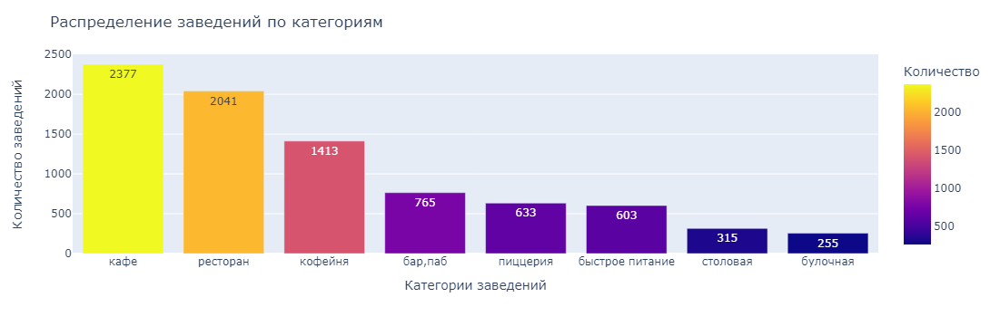

In [ ]:
fig = px.bar(category, 
             x='category', 
             y='name', 
             text ='name', 
             color='name',
             labels={'name':'Количество'}
            )
fig.update_layout(
                  title='Распределение заведений по категориям',
                  xaxis_title='Категории заведений',
                  yaxis_title='Количество заведений'
 )
fig.show()

На графике отчетливо видно, что приемущественно количество заведений типа "кафе","ресторан","кофейня", занимают лидирующие позиции. Наименее распространенными оказываются "столовая" и "булочная".

Посмотрим на  количество посадочных мест в местах по категориям. Сформируем сводную таблицу

In [ ]:
df.groupby('category')['seats'].describe().reset_index()

,category,count,mean,std,min,25%,50%,75%,max
0,"бар,паб",468.0,124.532051,145.011574,0.0,48.00,82.5,150.0,1288.0
1,булочная,147.0,88.115646,96.787050,0.0,25.00,50.0,120.0,625.0
2,быстрое питание,349.0,98.891117,106.611739,0.0,28.00,65.0,140.0,1040.0
3,кафе,1218.0,97.512315,117.985084,0.0,35.25,60.0,120.0,1288.0
4,кофейня,751.0,111.199734,127.837772,0.0,40.00,80.0,144.0,1288.0
5,пиццерия,427.0,94.496487,112.282703,0.0,30.00,55.0,120.0,1288.0
6,ресторан,1268.0,121.869874,123.838539,0.0,48.00,86.0,150.0,1288.0
7,столовая,164.0,99.750000,122.951453,0.0,40.00,75.5,117.0,1200.0


Похоже на большую вероятность ошибки значений в данных, более 1000 посадочных мест, а так же 0 мест.

Построим диаграммы размаха для наглядности

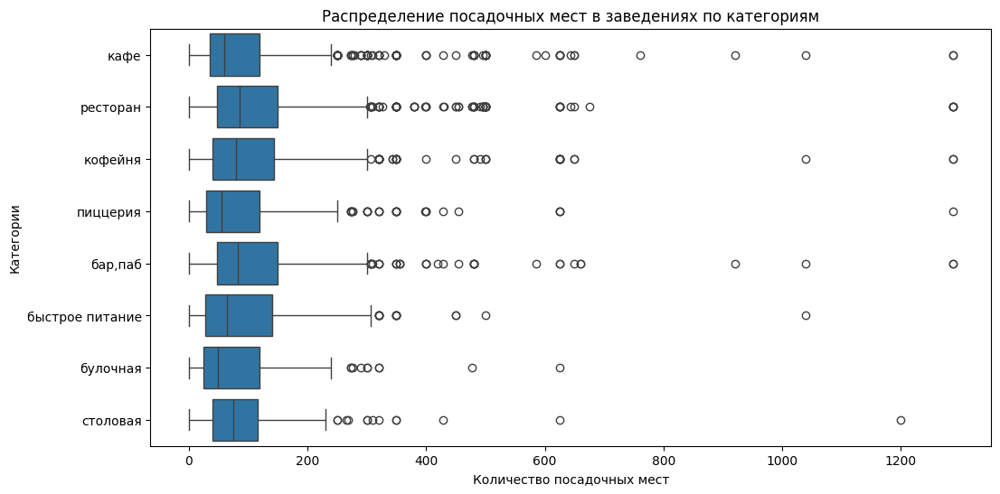

In [ ]:
plt.figure(figsize=(12,6))

ax = sns.boxplot(y='category', x='seats', data=df)

plt.title('Распределение посадочных мест в заведениях по категориям')
plt.xlabel('Количество посадочных мест')
plt.ylabel('Категории');

Видно, что есть выбросы данных по количеству посадочных мест. Укажем дополнительный параметр "showfliers" , чтобы увидеть выборку без выбросов для заведений.

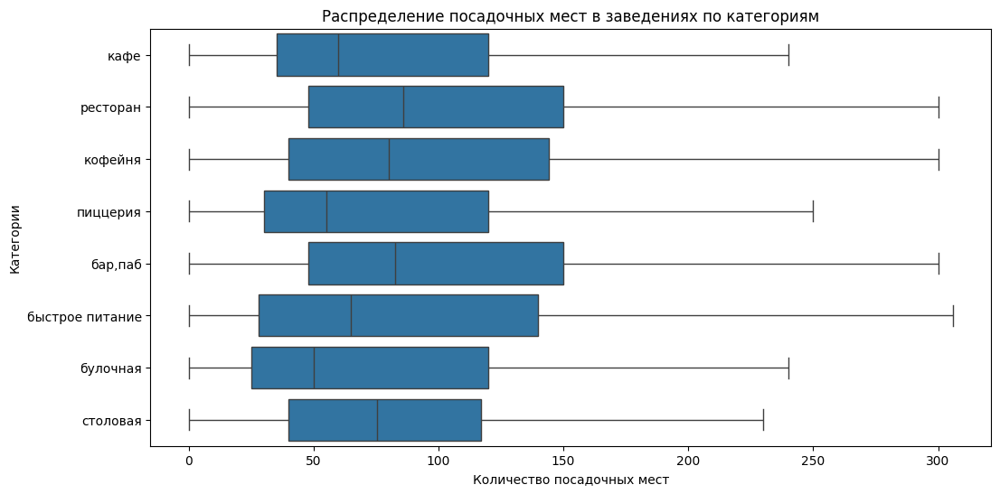

In [ ]:
plt.figure(figsize=(12,6))

ax = sns.boxplot(y='category', x='seats', data=df, showfliers= False  )

plt.title('Распределение посадочных мест в заведениях по категориям')
plt.xlabel('Количество посадочных мест')
plt.ylabel('Категории');

Заметно, что нормальный порог количества посадочных мест достигает значения выше 300, по медиане видно, что в среднем у заведений схожие количества посадочных мест и колеблется от 50 до 100. Посмотрим сколько заведений превышают 300 посадочных мест

In [ ]:
print('Процент от общего количества заведений:','{0:.2f}'.format((df[df['seats'] > 300]['name'].nunique()/df['name'].nunique())*100),'%')

Процент от общего количества заведений: 4.10 %


4% многовато, увеличим количество посадочных мест до 500

In [ ]:
print('Процент от общего количества заведений:','{0:.2f}'.format((df[df['seats'] > 500]['name'].nunique()/df['name'].nunique())*100),'%')

Процент от общего количества заведений: 1.00 %


1% заведений имеет количество посадочных мест больше 500, уберем такие данные и взглянем на медианное значение

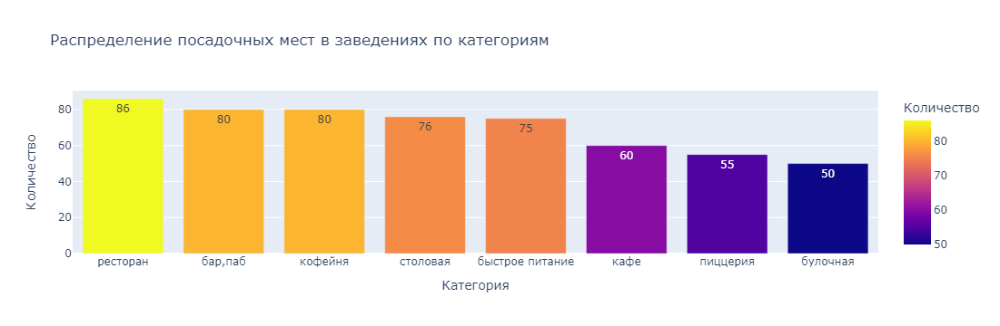

In [ ]:
seat = df[(df['seats'] < 500) & (df['seats'] !=0)]

px.bar(     (seat.pivot_table(index='category', 
                             values='seats', 
                             aggfunc=('median'))
                 .sort_values(by='seats',ascending=False)
                 .reset_index()),
    
       x='category', 
       y='seats', 
       text ='seats', 
       color='seats',
       title='Распределение посадочных мест в заведениях по категориям',
       labels={'seats':'Количество',
               'category':'Категория'}
        )


Заметно, что большим количеством посадочных мест обладают рестораны. Скорее всего из-за возможности проведения корпоративов и свадеб. Как и ожидалось диапазон медианного значения находится в промежутке от 50 до 86.

Рассмотрим соотношение сетевых и несетевых заведений.

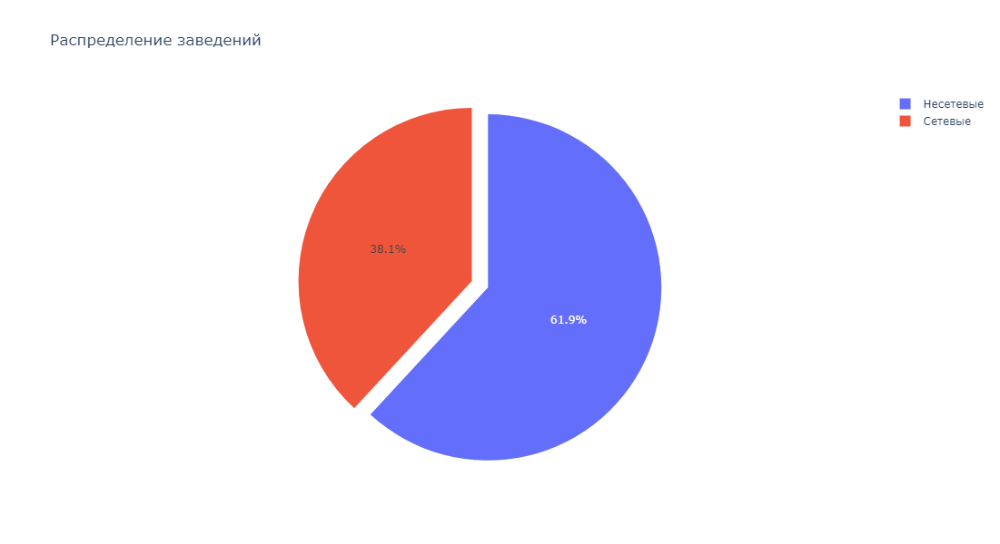

In [ ]:
chain = df.groupby('chain')['name'].count().reset_index()

fig = go.Figure(data=[go.Pie(labels=['Несетевые','Сетевые'], 
                             values=chain['name'], 
                             pull = [0.1, 0])]) 
fig.update_layout(title='Распределение заведений',
                  width=800, 
                  height=600)
fig.show() 

В данных представлены приемущественно несетевые заведения, а именно 61.9%

Посмотрим какие категории заведений чаще являются сетевыми

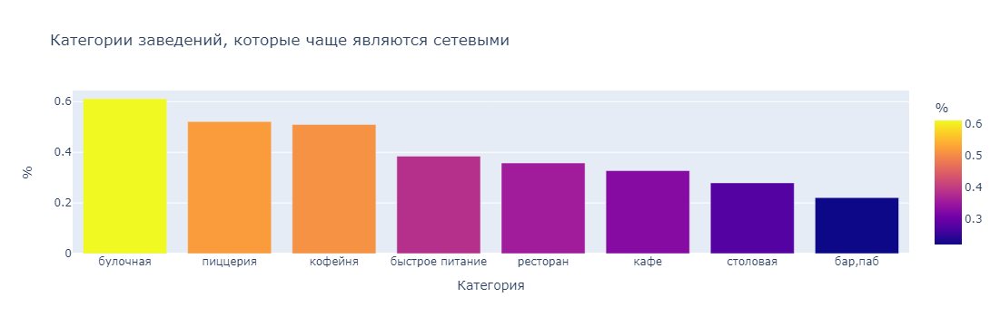

In [ ]:
px.bar((df.groupby('category')
          .agg({'chain':'mean'})
          .sort_values(by='chain', ascending=False)
          .reset_index()),
       
       x='category', 
       y='chain',         
       color='chain',
       title='Категории заведений, которые чаще являются сетевыми',
       labels={'chain':'%',
               'category':'Категория'}
        )

Чаще всего сетевыми заведениями являются "булочныя", "пиццерия","кофейня".

Определим топ-15 популярных сетей в Москве. Под популярностью понимается количество заведений этой сети в регионе. 

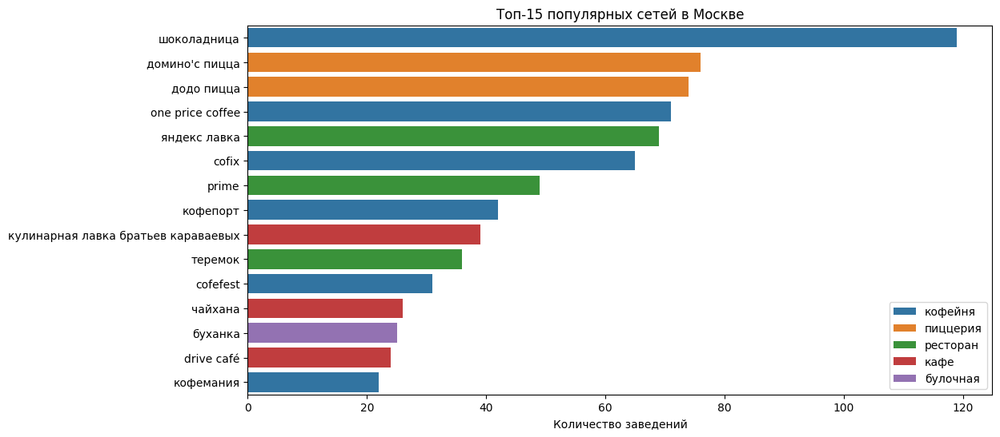

In [ ]:
pop = (df[df['chain']==1].groupby(['name','category'])
                         .agg({'chain':'count'})
                         .sort_values(by='chain', ascending=False)
                         .reset_index()
                         .head(15))

plt.figure(figsize=(14,6))

sns.barplot(data=pop,y='name',x='chain',hue='category')
plt.title('Топ-15 популярных сетей в Москве')
plt.xlabel('Количество заведений')
plt.ylabel(None)
plt.legend(loc='lower right', fontsize=10);

Лидерующей сетью по количеству заведений является кофейня Шоколадница - 120 заведений в регионе. Категория "кофейня", является наиболее популярной.

Посмотрим какие административные районы Москвы присутствуют в датасете, отобразим общее количество заведений и количество заведений каждой категории по районам. 

Общее количество заведений в датасете: 8402


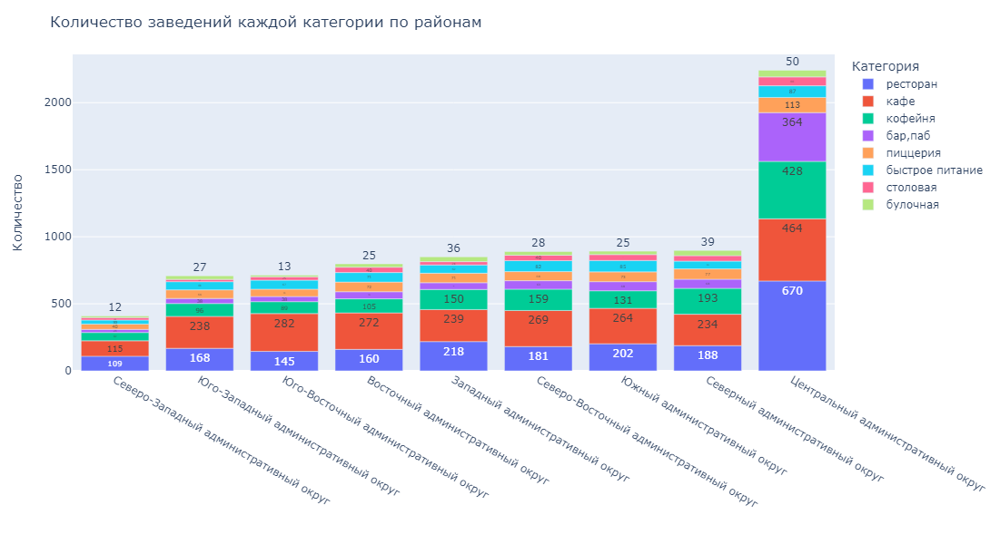

In [ ]:
print('Общее количество заведений в датасете:', df['name'].count())
t = px.bar((df.groupby(['category','district'])
          .agg({'name':'count'})
          .reset_index()
          .sort_values(by='name',ascending=False)),
       
       x='district',
       y='name',
       color='category',
       text ='name',
       height=600,
       labels={'name':'Количество',
               'district':' ',
              'category':'Категория'})

t.update_layout(title='Количество заведений каждой категории по районам',
                  xaxis={'categoryorder':'total ascending'})
t.show()

Общее количество заведений = 8402. По региону наблюдаем всего 9 округов. Наибольшее количество заведений расположено в Центральном Административном округе, преобладающая категория заведений этого округа - "Кофейня". Наименьшее количество заведений в категории "Булочная" по всем округам.


Визуализируйте распределение средних рейтингов по категориям заведений. Сильно ли различаются усреднённые рейтинги в разных типах общепита?

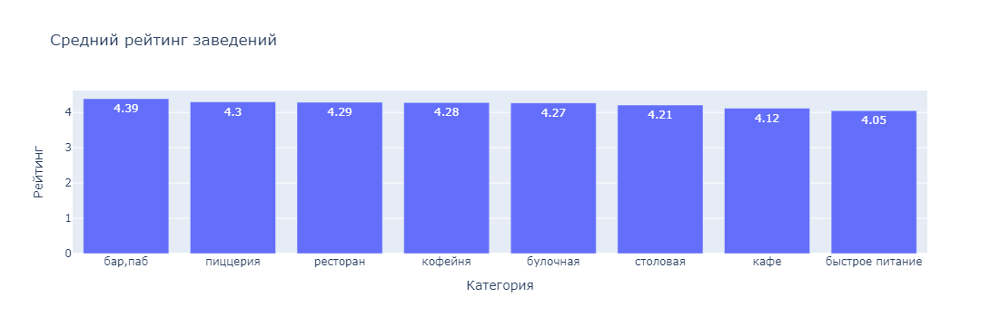

In [ ]:
rating_df = df.groupby('category').agg({'rating':'mean'}).reset_index().sort_values(by='rating',ascending=False)
rating_df['rating'] = rating_df['rating'].round(2)
px.bar(rating_df,
       x='category',
       y='rating',
       text='rating',
       title='Средний рейтинг заведений',
       labels={'rating':'Рейтинг',
               'category':'Категория'})


Заметна не высокая разница в средних показателях рейтинга заведений по категориям, однако лидером является категория "бар,паб" с показателем 4.39

Построим фоновую картограмму со средним рейтингом заведений каждого района

In [ ]:
# подключаем модуль для работы с JSON-форматом
import json

# читаем файл и сохраняем в переменной
try: 
    with open('/datasets/admin_level_geomap.geojson', 'r') as f:
        geo_json = json.load(f)
except: 
    with open('C:\\Users\\tema-\\Downloads\\Jupyter\\Doc_csv\\admin_level_geomap.geojson', 'r') as f:
        geo_json = json.load(f)

print(json.dumps(geo_json, indent=2, ensure_ascii=False, sort_keys=True))

{
  "features": [
    {
      "geometry": {
        "coordinates": [
          [
            [
              [
                37.8756653,
                55.825342400000004
              ],
              [
                37.876001599999995,
                55.8249027
              ],
              [
                37.8730967,
                55.8237936
              ],
              [
                37.8689418,
                55.8228697
              ],
              [
                37.869206999999996,
                55.822363200000005
              ],
              [
                37.868322500000005,
                55.822211100000004
              ],
              [
                37.867472,
                55.823703
              ],
              [
                37.86851090000001,
                55.82391880000001
              ],
              [
                37.87046039999999,
                55.8242706
              ],
              [
                37.87172779999

In [ ]:
rating_df = df.groupby('district', as_index=False)['rating'].agg('mean')
rating_df = round(rating_df,2).sort_values(by='rating',ascending=False)


In [ ]:
# импортируем карту и хороплет
from folium import Map, Choropleth

# загружаем JSON-файл с границами округов Москвы
state_geo = 'https://code.s3.yandex.net/data-analyst/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_df,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианный рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

Видно, что заведения с высоким рейтингом сосредоточены в центральном райне, может, потому что люди просто чаще оставляют оценки, а может уровень сервиса и качество продуктов лучше.

Отобразите все заведения датасета 

In [ ]:
# импортируем карту и маркер
from folium import Map, Marker
# импортируем кластер
from folium.plugins import MarkerCluster

# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
df.apply(create_clusters, axis=1)

# выводим карту
m

<div class="alert alert-success" style="border-radius: 10px; box-shadow: 2px 2px 2px; border: 1px solid; padding: 10px ">
<b>Комментарий ревьюера v.1</b> 
    
👍 
Отлично. Здесь все корректно.
</div>

Найдем топ-15 улиц по количеству заведений. Постройте график распределения количества заведений и их категорий по этим улицам. Попробуйте проиллюстрировать эту информацию одним графиком.

Определим топ 15 улиц по количеству заведений.

In [ ]:
top_15_street = df.groupby('street')['name'].count().reset_index().sort_values(by='name',ascending=False).head(15)
top_15_street

,street,name
837,проспект мира,183
841,профсоюзная улица,122
834,проспект вернадского,108
533,ленинский проспект,107
531,ленинградский проспект,95
379,дмитровское шоссе,88
461,каширское шоссе,77
304,варшавское шоссе,76
532,ленинградское шоссе,70
610,мкад,65


Посмотрим какие категории заведений есть на этих улицах

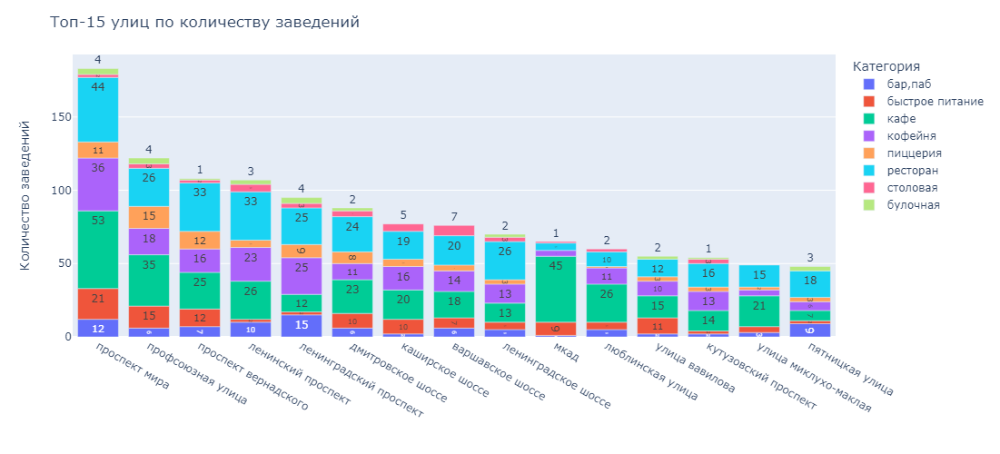

In [ ]:
p = px.bar((df[df['street'].isin(top_15_street['street'])]
                           .groupby(['street','category'])['name']
                           .count()
                           .reset_index()),
      
           x='street',
           y='name',
           color='category',
           height=500,
           text='name',
           labels={'name':'Количество заведений',
                   'street':' ',
                   'category':'Категория'})

p.update_layout(title='Топ-15 улиц по количеству заведений',
                  xaxis={'categoryorder':'total descending'})
p.show()

Большим количеством заведений обладает улица "Проспект Мира". Однако по категориям есть различия, основными среди всех улиц можно выявить "кафе","ресторан","кофейня". 

Найдем улицы, на которых находится только один объект общепита. Что можно сказать об этих заведениях?

In [ ]:
bot_street = df.groupby('street')['name'].count().reset_index().sort_values(by='name')
bot_street = bot_street[bot_street['name']==1]
bot_street

,street,name
0,1-й автозаводский проезд,1
681,новосущёвская улица,1
687,новощукинская улица,1
689,новоясеневский тупик,1
694,одинцовская улица,1
...,...,...
5,1-й голутвинский переулок,1
302,валдайский проезд,1
6,1-й грайвороновский проезд,1
190,балакиревский переулок,1


457 улиц с одним обьектом общепита, посмотрим на категории этих заведений.

In [ ]:
df[df['street'].isin(bot_street['street'])].groupby('category')['name'].count().sort_values(ascending=False)

category
кафе               159
ресторан            93
кофейня             84
бар,паб             39
столовая            36
быстрое питание     23
пиццерия            15
булочная             8
Name: name, dtype: int64

Распространенная категория с одним заведением по улице - "Кафе". Реже встречается "булочная".

Посчитаем медиану middle_avg_bill для каждого района. Построим фоновую хороплет с полученными значениями для каждого района. Проанализируем цены в центральном административном округе и других. Определим как удалённость от центра влияет на цены в заведениях.

In [ ]:
avg_bill = df.groupby('district')['middle_avg_bill'].median().reset_index().sort_values(by='middle_avg_bill',ascending=False)
avg_bill

,district,middle_avg_bill
1,Западный административный округ,1000.0
5,Центральный административный округ,1000.0
4,Северо-Западный административный округ,700.0
2,Северный административный округ,650.0
7,Юго-Западный административный округ,600.0
0,Восточный административный округ,575.0
3,Северо-Восточный административный округ,500.0
8,Южный административный округ,500.0
6,Юго-Восточный административный округ,450.0


In [ ]:
# импортируем карту и хороплет
from folium import Map, Choropleth

# загружаем JSON-файл с границами округов Москвы
state_geo = 'https://code.s3.yandex.net/data-analyst/admin_level_geomap.geojson'

# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
c = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=avg_bill, 
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='PuBu',
    fill_opacity=0.8,    
    legend_name='Медианный чек заведений по районам',
).add_to(c)

# выводим карту
c

<Figure size 1200x600 with 0 Axes>

На карте видно, что удаленность от центра влияет на снижение среднего чека, однако в западном направлении высокая стоимость сохраняется, такая же как и в центральном районе. Наименьшие средние чеки находятся в Юго-Восточном и Южном направлениях

Общий вывод:
- Общее количество заведений = 8402.
- По региону наблюдаем всего 9 округов.
- Приемущественно количество заведений типа "кафе","ресторан","кофейня", занимают лидирующие позиции. Наименее распространенными оказываются "столовая" и "булочная".
- Большим количеством посадочных мест обладают рестораны. 
- В данных представлены приемущественно несетевые заведения, а именно 61.9%. Чаще всего сетевыми заведениями являются "Булочныя", "пиццерия","кофейня".
- Лидерующей сетью по количеству заведений является кофейня Шоколадница - 120 заведений в регионе.
- Категория "кофейня", является наиболее популярной.
- Наибольшее количество заведений расположено в Центральном Административном округе, преобладающая категория заведений этого округа - "Кофейня".
- Наименьшее количество заведений в категории "Булочная" по всем округам.
- В средних показателях рейтинга заведений по категориям лидером является категория "бар,паб" с показателем 4.39. Заведения с высоким рейтингом сосредоточены в центральном райне
- Большим количеством заведений обладает улица "Проспект Мира". 
- Удаленность от центра влияет на снижение среднего чека, однако в западном направлении высокая стоимость сохраняется, такая же как и в центральном районе. Наименьшие средние чеки находятся в Юго-Восточном и Южном направлениях.


### Шаг 4. Детализируем исследование: открытие кофейни

Сколько всего кофеен в датасете?

In [ ]:
print('Всего в Москве заведений категории "кофейня"  :', df[df['category']=='кофейня']['name'].count())

Всего в Москве заведений категории "кофейня"  : 1413


В каких районах их больше всего, каковы особенности их расположения?

In [ ]:
df[df['category']=='кофейня'].groupby('district')['name'].count().sort_values(ascending=False)

district
Центральный административный округ         428
Северный административный округ            193
Северо-Восточный административный округ    159
Западный административный округ            150
Южный административный округ               131
Восточный административный округ           105
Юго-Западный административный округ         96
Юго-Восточный административный округ        89
Северо-Западный административный округ      62
Name: name, dtype: int64

Есть ли круглосуточные кофейни?

In [ ]:
display('Всего круглосуточных заведений категории кофейня по райнам:', 
      df[(df['category']=='кофейня')&(df['is_24_7']==True)].groupby('district')['name'].count().sort_values(ascending=False))

'Всего круглосуточных заведений категории кофейня по райнам:'

district
Центральный административный округ         26
Западный административный округ             9
Юго-Западный административный округ         7
Восточный административный округ            5
Северный административный округ             5
Северо-Восточный административный округ     3
Северо-Западный административный округ      2
Юго-Восточный административный округ        1
Южный административный округ                1
Name: name, dtype: int64

Какие у кофеен рейтинги и как они распределяются по районам

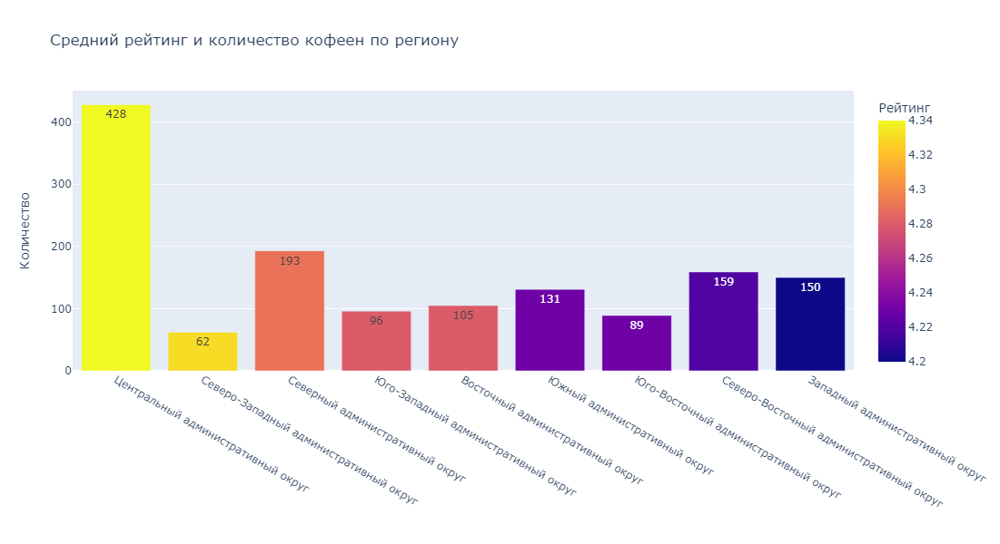

In [ ]:
px.bar((df[df['category']=='кофейня']
     .groupby('district')[['name','rating']]
     .agg({'name':'count',
           'rating':'mean'})
     .reset_index()
     .sort_values(by='rating',ascending=False)
     .round(2)),

    x='district',
    y='name',
    color='rating',
    height=600,
    text='name',
    title='Средний рейтинг и количество кофеен по региону',
    labels={'name':'Количество',
            'district':' ',
            'rating':'Рейтинг'}    
      )

Посмотрим на медианную стоимость чашки капучино по районам 

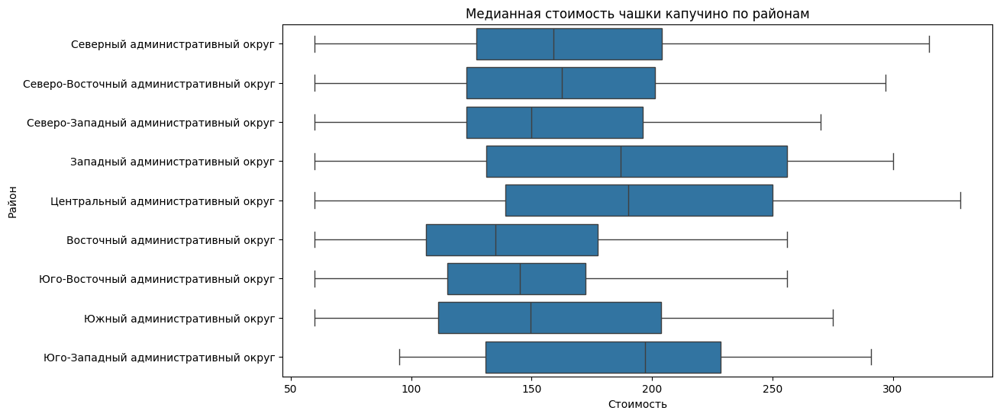

In [ ]:
plt.figure(figsize=(12,6))
sns.boxplot(data=df,x='middle_coffee_cup',y='district',showfliers=False)
plt.xlabel('Стоимость')
plt.ylabel('Район')
plt.title('Медианная стоимость чашки капучино по районам');

In [ ]:
df.groupby('district')['middle_coffee_cup'].median().sort_values(ascending=False)

district
Юго-Западный административный округ        197.0
Центральный административный округ         190.0
Западный административный округ            187.0
Северо-Восточный административный округ    162.5
Северный административный округ            159.0
Северо-Западный административный округ     150.0
Южный административный округ               149.5
Юго-Восточный административный округ       145.0
Восточный административный округ           135.0
Name: middle_coffee_cup, dtype: float64

In [ ]:
df['middle_coffee_cup'].median()

169.0

Наименьшая медианная стоимость чашки капучино меньше 135 рублей в Восточном районе. Максимальная медианная стоимость 197 рублей в районе Юго-Западный.
В общих чертах медианная стоимость находится в диапазоне 135-197 рублей. 

#### Рекомендация

Основателям фонда «Shut Up and Take My Money» не даёт покоя успех сериала «Друзья». Их мечта — открыть такую же крутую и доступную, как «Central Perk», кофейню в Москве.

На основании своих исследований, могу предположить, что:
- Лучше будет выбрать популярный район для открытия кофейни например Центральный, так как будет выше проходимость клиентов.
- Обеспечив конкуретный сервис и хорошее качество товара, можно рассчитывать и на постоянных посетителей, что позволит создать атмосферу френдли как в сериале.
- Установить доступную стоимость на товары, на примере чашки капучино в пределах 165-175 рублей
- Можно сделать ее круглосуточной, это позволит гостям в любое время оказаться в любимом месте.

### Шаг 5. Презентация

https://disk.yandex.ru/i/eMvJKkQKEJ38uQ